### Important code snippets:

- Simple regression: plot prior lines (Code 5.4, Code 5.33 even cleaner)
- As of pymc5, Use pytensor.shared to train the model on one dataset, and then later predict on a 2nd dataset (Code 5.19, 5.23)
- Counterfactual plots: one covariate v. outcome (Code 5.22, 5.23)
- Model checking plot: observed outcome v. predicted outcome, with error bars on each instance (Code 5.16)
- In a regression model, sampling the predicted mean response (given new inputs) is done via `pm.sample_posterior_predictive()`, & make sure to wrap `pm.Deterministic()` around the mean variable in the model definition code snippet. 
- Compare the same parameter's posterior across different models: `az.plot_forest([trace1, trace2], var_names=["mu"])`. (Code 5.39)

### Cases:

- Interpretation of parameters depends on your belief on the causal model. One set of coefficients can correspond to many causal models. ("Markov equivalence")

- Conditional independence demo: DMA dag and m5_3. Once A is included in the model, there is no predictive tower of M for D. In other words, D \_||\_ M | A

- Masking relationship between two predictors: Code 5.36 - 5.42 (both predictors are positively correlated with the outcome, but the correlation is negative between them)

In [19]:
import pandas as pd
import numpy as np
import arviz as az
import pymc as pm
import xarray as xr
import seaborn as sns
from pytensor import shared
import matplotlib.pyplot as plt
from daft import PGM

az.rcParams["stats.hdi_prob"] = 0.89
az.style.use("arviz-docgrid")
%config InlineBackend.figure_format = 'retina'
RANDOM_SEED = 8927
rng = np.random.default_rng(RANDOM_SEED)

### Code 5.1

In [25]:
from sklearn.preprocessing import StandardScaler

d = pd.read_csv("./Data/WaffleDivorce.csv", delimiter=";")
d[["A", "M", "D"]] = StandardScaler().fit_transform(d[["MedianAgeMarriage", "Marriage", "Divorce"]])
d.head()

,Location,Loc,Population,MedianAgeMarriage,Marriage,Marriage SE,Divorce,Divorce SE,WaffleHouses,South,Slaves1860,Population1860,PropSlaves1860,A,M,D
0,Alabama,AL,4.78,25.3,20.2,1.27,12.7,0.79,128,1,435080,964201,0.45,-0.612445,0.022874,1.671000
1,Alaska,AK,0.71,25.2,26.0,2.93,12.5,2.05,0,0,0,0,0.00,-0.693671,1.565536,1.560044
2,Arizona,AZ,6.33,25.8,20.3,0.98,10.8,0.74,18,0,0,0,0.00,-0.206314,0.049472,0.616916
3,Arkansas,AR,2.92,24.3,26.4,1.70,13.5,1.22,41,1,111115,435450,0.26,-1.424706,1.671927,2.114824
4,California,CA,37.25,26.8,19.1,0.39,8.0,0.24,0,0,0,379994,0.00,0.605947,-0.269700,-0.936470


### Code 5.2

In [26]:
d.MedianAgeMarriage.std()

1.2436303013880823

### Code 5.3

Sample prior slopes and plot

In [27]:
with pm.Model() as m5_1:
    a = pm.Normal("a", 0, 0.2)
    bA = pm.Normal("bA", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    mu = a + bA*d.A
    D = pm.Normal("D", mu, sigma, observed=d.D)

In [28]:
with m5_1:
    priors = pm.sample_prior_predictive().prior
    trace5_1 = pm.sample()

Sampling: [D, a, bA, sigma]
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bA, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


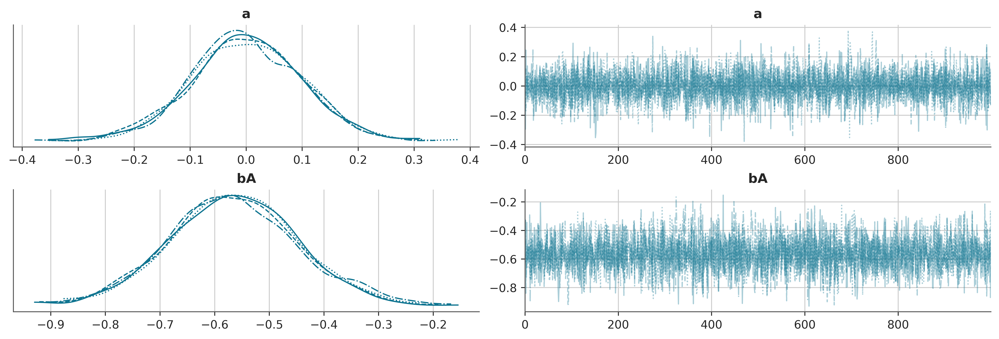

In [6]:
az.plot_trace(trace5_1, var_names=["a", "bA"]);

### Code 5.4

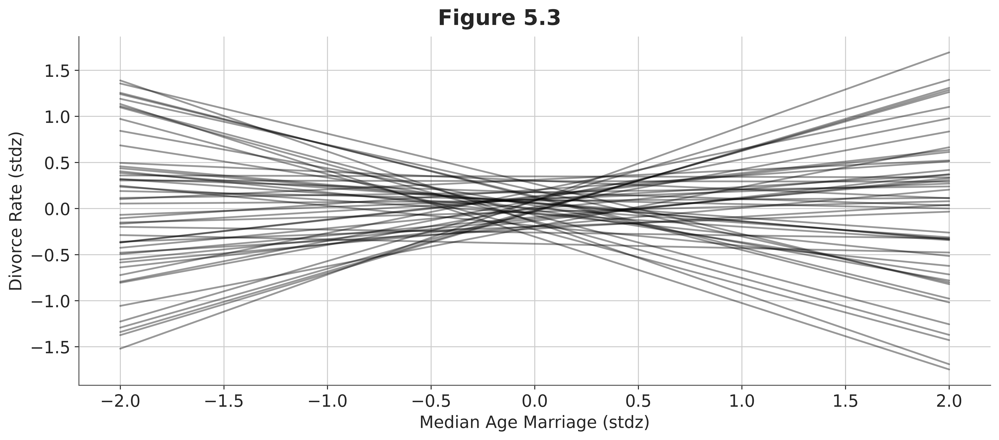

In [42]:
fig, ax = plt.subplots()

x = np.linspace(-2, 2, 50)

prior_samp_a = np.array(az.extract(priors).a[:50])
prior_samp_bA = np.array(az.extract(priors).bA[:50])

for a, ba in zip(prior_samp_a, prior_samp_bA):
    y = a + ba * x
    ax.plot(x, y, c="black", alpha=0.4)

ax.set_xlabel("Median Age Marriage (stdz)")
ax.set_ylabel("Divorce Rate (stdz)")
fig.suptitle("Figure 5.3");

### Code 5.5

In [ ]:
with m5_1:
    idata = pm.sample()

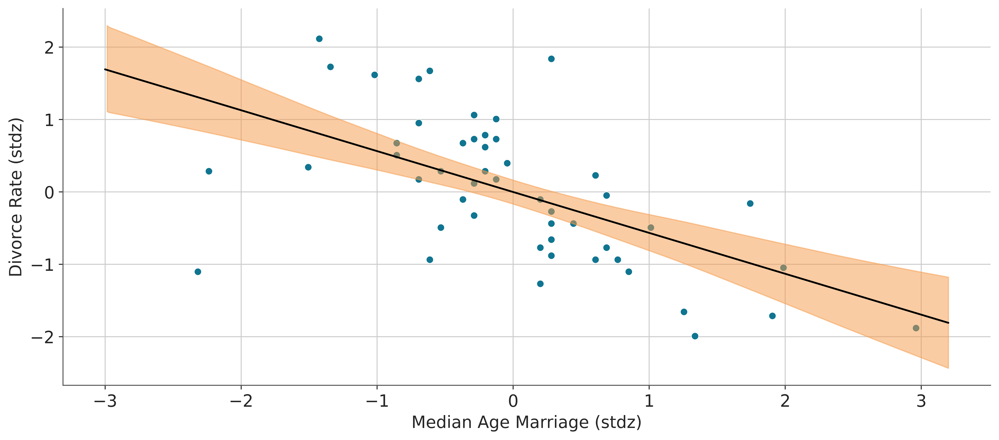

In [67]:
post = idata.posterior
A_seq = np.linspace(-3, 3.2, 30)
post_bA, A_seq_ex = xr.broadcast(post.bA, xr.DataArray(A_seq))
mu_draws = post.a + post_bA * A_seq_ex

_, ax = plt.subplots()
ax.plot(A_seq, mu_draws.mean(("chain", "draw")), color="k")
sns.scatterplot(ax=ax, data=d, x="A", y="D")
az.plot_hdi(A_seq, mu_draws, ax=ax, color="C2")
ax.set_xlabel("Median Age Marriage (stdz)")
ax.set_ylabel("Divorce Rate (stdz)");

### Code 5.6

In [29]:
with pm.Model() as m5_2:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    mu = a + bM*d.M
    D = pm.Normal("D", mu, sigma, observed=d.D)
    trace5_2 = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


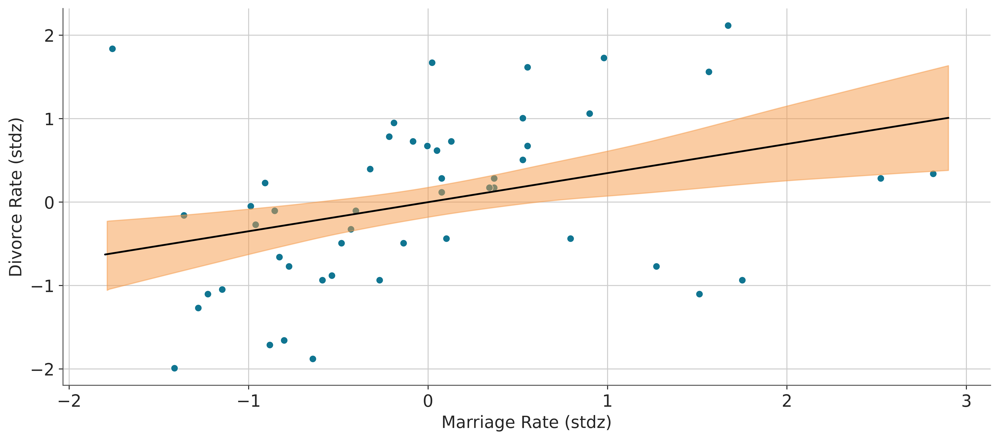

In [79]:
post = idata.posterior
M_seq = np.linspace(-1.8, 2.9, 30)
post_bM, M_seq_ex = xr.broadcast(post.bM, xr.DataArray(M_seq))
mu_draws = post.a + post_bM * M_seq_ex

_, ax = plt.subplots()
ax.plot(M_seq, mu_draws.mean(("chain", "draw")), color="k")
sns.scatterplot(ax=ax, data=d, x="M", y="D")
az.plot_hdi(M_seq, mu_draws, ax=ax, color="C2")
ax.set_xlabel("Marriage Rate (stdz)")
ax.set_ylabel("Divorce Rate (stdz)");

### Code 5.7

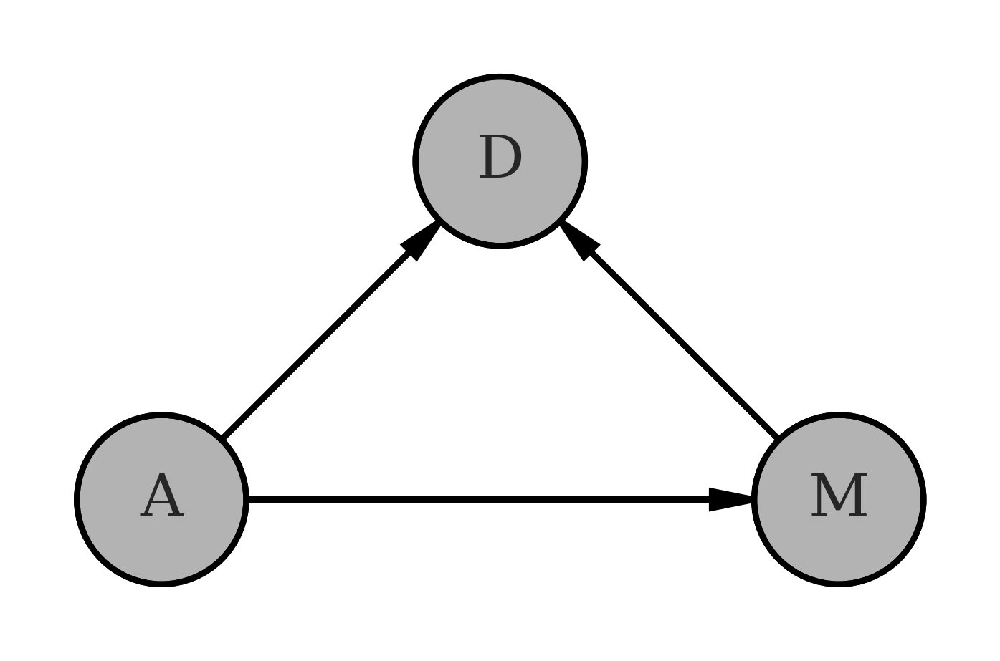

In [24]:
dag5_1 = PGM()
dag5_1.add_node("A", "A", 0, 0, observed=True)
dag5_1.add_node("D", "D", 1, 1, observed=True)
dag5_1.add_node("M", "M", 2, 0, observed=True)
dag5_1.add_edge("A", "D")
dag5_1.add_edge("A", "M")
dag5_1.add_edge("M", "D")
dag5_1.render();

### Code 5.10

In [30]:
with pm.Model() as m5_3:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    bA = pm.Normal("bA", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    mu = pm.Deterministic("mu", a + bM*d.M + bA*d.A)
    D = pm.Normal("D", mu, sigma, observed=d.D)
    trace5_3 = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bA, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


In [105]:
az.summary(trace5_3, var_names=["a", "bM", "bA", "sigma"], kind="stats", round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%
a,-0.00,0.10,-0.16,0.16
bM,-0.06,0.16,-0.31,0.19
bA,-0.60,0.16,-0.86,-0.35
sigma,0.84,0.09,0.70,0.98


### Code 5.11

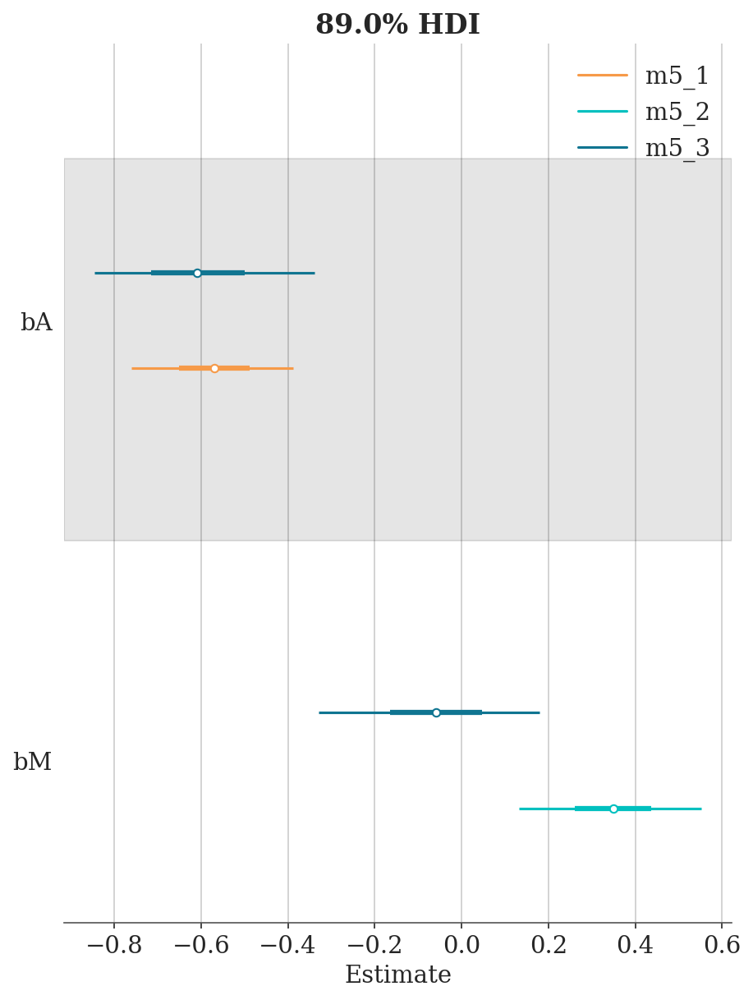

In [35]:
_, ax = plt.subplots(dpi=75, figsize=(6, 8))
az.plot_forest([trace5_3, trace5_2, trace5_1],
    model_names=["m5_3", "m5_2", "m5_1"],
    var_names=["bA", "bM"],
    combined=True,
    ax=ax
)
ax.set(xlabel="Estimate");

### Code 5.12
Overthinking: simulating the divorce example

In [37]:
N = 50
age = rng.normal(N)
mar = rng.normal(size=N, loc=-age) # A -> M
div = rng.normal(size=N, loc=age) # A -> D
d_sim = pd.DataFrame({"A": age, "M": mar, "D": div})

In [39]:
with pm.Model() as m5_1:
    a = pm.Normal("a", 0, 0.2)
    bA = pm.Normal("bA", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    mu = a + bA*d_sim.A
    D = pm.Normal("D", mu, sigma, observed=d_sim.D)
    trace5_1 = pm.sample()
    
with pm.Model() as m5_2:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    mu = a + bM*d_sim.M
    D = pm.Normal("D", mu, sigma, observed=d_sim.D)
    trace5_2 = pm.sample()
    
with pm.Model() as m5_3:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    bA = pm.Normal("bA", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    mu = pm.Deterministic("mu", a + bM*d_sim.M + bA*d_sim.A)
    D = pm.Normal("D", mu, sigma, observed=d_sim.D)
    trace5_3 = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bA, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bA, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 52 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.


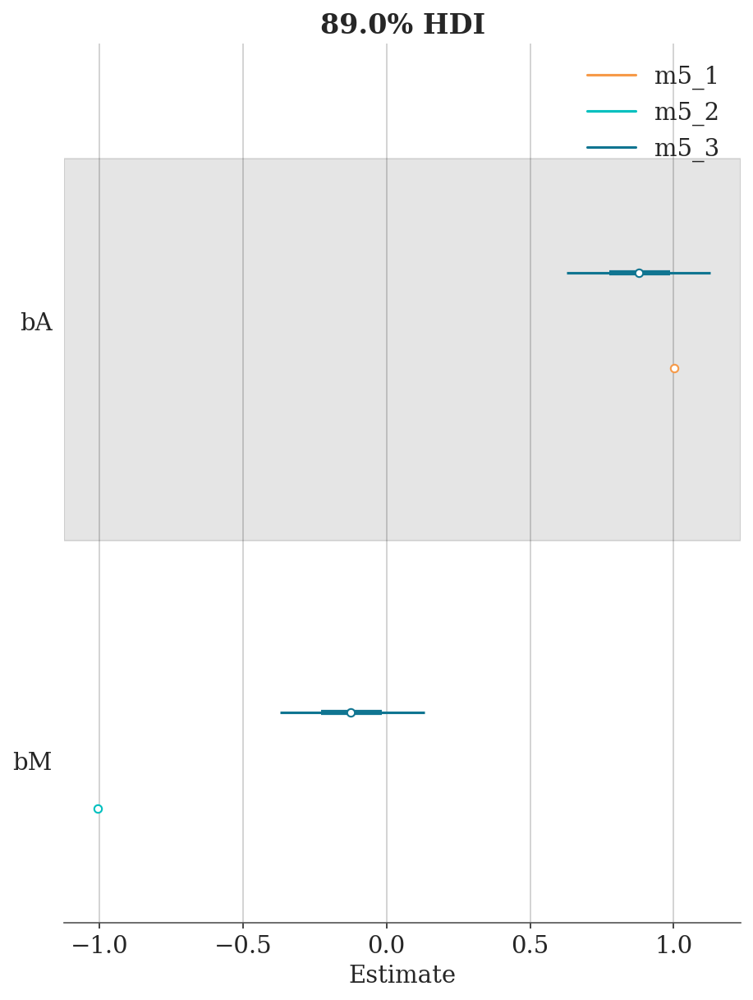

In [40]:
_, ax = plt.subplots(dpi=75, figsize=(6, 8))
az.plot_forest([trace5_3, trace5_2, trace5_1],
    model_names=["m5_3", "m5_2", "m5_1"],
    var_names=["bA", "bM"],
    combined=True,
    ax=ax
)
ax.set(xlabel="Estimate");

### Code 5.13

In [44]:
with pm.Model() as m5_4:
    a = pm.Normal("a", 0, 0.2)
    bAM = pm.Normal("bAM", 0, 0.5)
    mu = pm.Deterministic("mu", a + bAM*d.A)
    sigma = pm.Exponential("sigma", 1)
    M = pm.Normal("M", mu=mu, sigma=sigma, observed=d.M)
    trace5_4 = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bAM, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


### Code 5.14

In [47]:
with m5_4:
    mu_ppd = pm.sample_posterior_predictive(trace5_4).posterior_predictive
    
mu_ppd

Sampling: [M]


<xarray.Dataset>
Dimensions:  (chain: 4, draw: 1000, M_dim_2: 50)
Coordinates:
  * chain    (chain) int64 0 1 2 3
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999
  * M_dim_2  (M_dim_2) int64 0 1 2 3 4 5 6 7 8 9 ... 41 42 43 44 45 46 47 48 49
Data variables:
    M        (chain, draw, M_dim_2) float64 0.5636 1.788 1.846 ... -0.2705 1.906
Attributes:
    created_at:                 2023-04-06T05:16:24.710536
    arviz_version:              0.15.1
    inference_library:          pymc
    inference_library_version:  5.2.0

In [48]:
with m5_4:
    mu_ppd = pm.sample_posterior_predictive(trace5_4, var_names=["mu"]).posterior_predictive.mu
    mu_mean = mu_ppd.mean(("chain", "draw"))
    mu_resid = d.M - mu_mean

Sampling: []


[Text(0.5, 0, 'age at marriage (std)'), Text(0, 0.5, 'marriage rate (std)')]

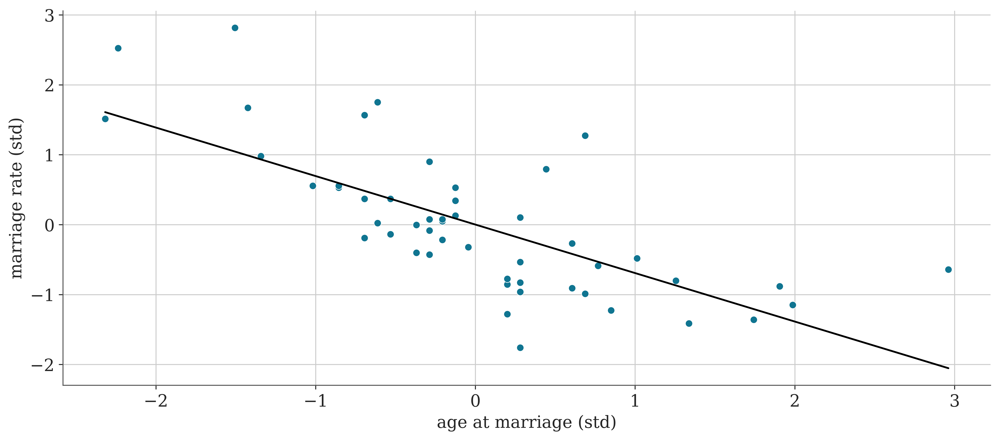

In [58]:
_, ax = plt.subplots()
sns.scatterplot(x=d.A, y=d.M, ax=ax)
    sns.lineplot(x=d.A, y=mu_mean, color="k", ax=ax)
ax.set(xlabel="age at marriage (std)", ylabel="marriage rate (std)")

### Code 5.15

In [127]:
post = trace5_3.posterior
mu_mean = post.mu.mean(("chain", "draw"))
mu_PI = az.hdi(post.mu)

with m5_3:
    post_pred = pm.sample_posterior_predictive(trace5_3).posterior_predictive
    
D_sim  = post_pred.D
D_sim_mean = D_sim.mean(("chain", "draw"))
D_PI = az.hdi(D_sim)

Sampling: [D]


### Code 5.16

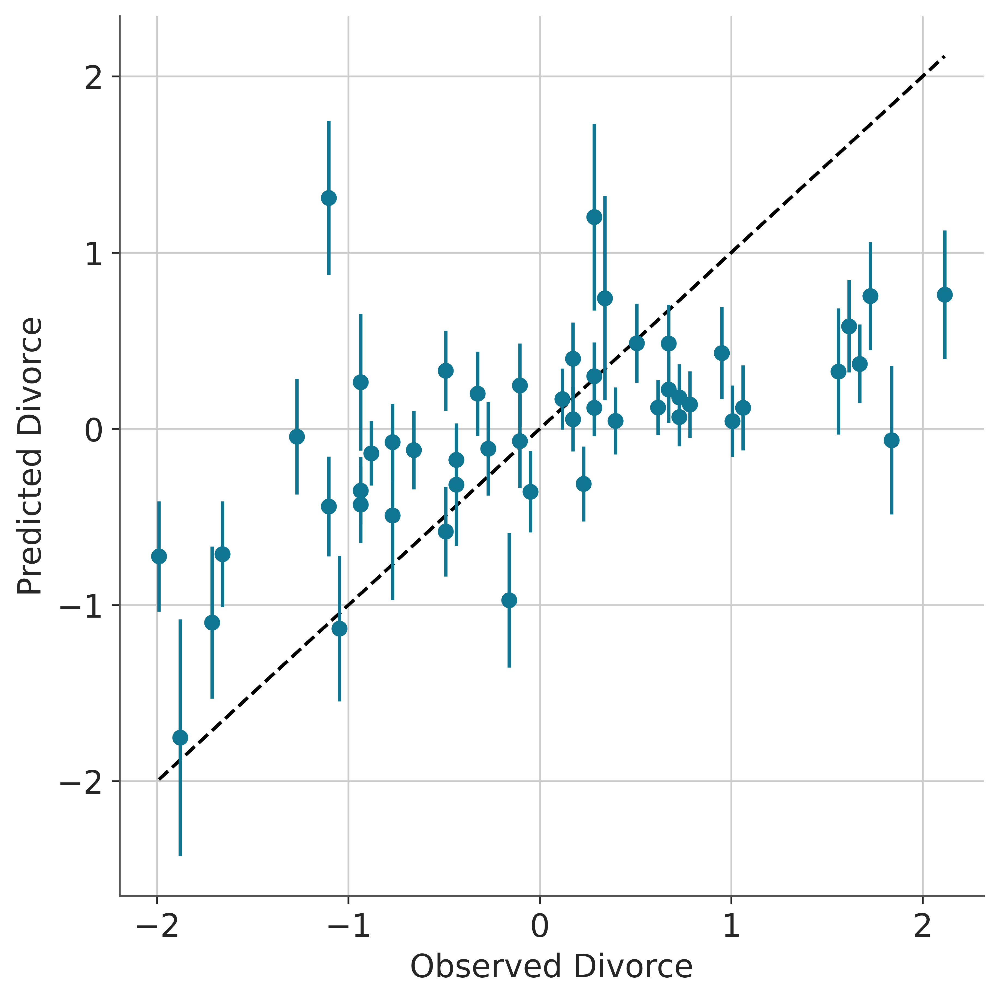

In [136]:
_, ax = plt.subplots(figsize=(6, 6))
sns.scatterplot(x=d.D, y=mu_mean, ax=ax);
min_x, max_x = d.D.min(), d.D.max()
ax.plot([min_x, max_x], [min_x, max_x], "k--")

plt.errorbar(
    d.D,
    mu_mean,
    yerr=np.abs(np.array(mu_mean) - mu_PI.min(dim="hdi").to_array()),
    fmt="C0o",
)

ax.set(xlabel="Observed Divorce", ylabel="Predicted Divorce"); 

### Code 5.18

In [59]:
N = 100
x_real = rng.normal(N)
x_spur = rng.normal(size=N, loc=x_real)
y = rng.normal(size=N, loc=x_real)
d_sim = pd.DataFrame({"y": y, "x_real": x_real, "x_spur": x_spur})

### Code 5.19

In [4]:
from sklearn.preprocessing import StandardScaler

d = pd.read_csv("./Data/WaffleDivorce.csv", delimiter=";")
d[["A", "D", "M"]] = StandardScaler().fit_transform(d[["MedianAgeMarriage", "Divorce", "Marriage"]])
d.head()

,Location,Loc,Population,MedianAgeMarriage,Marriage,Marriage SE,Divorce,Divorce SE,WaffleHouses,South,Slaves1860,Population1860,PropSlaves1860,A,D,M
0,Alabama,AL,4.78,25.3,20.2,1.27,12.7,0.79,128,1,435080,964201,0.45,-0.612445,1.671000,0.022874
1,Alaska,AK,0.71,25.2,26.0,2.93,12.5,2.05,0,0,0,0,0.00,-0.693671,1.560044,1.565536
2,Arizona,AZ,6.33,25.8,20.3,0.98,10.8,0.74,18,0,0,0,0.00,-0.206314,0.616916,0.049472
3,Arkansas,AR,2.92,24.3,26.4,1.70,13.5,1.22,41,1,111115,435450,0.26,-1.424706,2.114824,1.671927
4,California,CA,37.25,26.8,19.1,0.39,8.0,0.24,0,0,0,379994,0.00,0.605947,-0.936470,-0.269700


In [115]:
M_shared = shared(d.M.values)
A_shared = shared(d.A.values)

with pm.Model() as m5_3A:
    # A -> M
    aM = pm.Normal("aM", 0, 0.2)
    bAM = pm.Normal("bAM", 0, 0.5)
    sigma_M = pm.Exponential("sig_M", 1)
    mu_M = aM + bAM*A_shared
    M = pm.Normal("M", mu_M, sigma_M, observed=d.M.values, shape=mu_M.shape)
    
    
    # A -> D <- M
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    bA = pm.Normal("bA", 0, 0.5)
    sigma = pm.Exponential("sig", 1)
    mu = a + bM*M_shared + bA*A_shared
    D = pm.Normal("D", mu, sigma, observed=d.D.values, shape=mu.shape)    

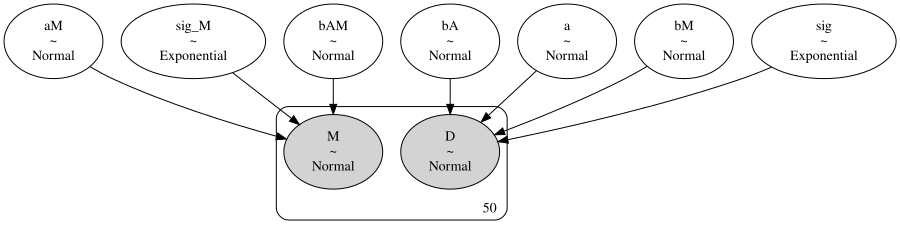

In [116]:
pm.model_to_graphviz(m5_3A)

In [104]:
with m5_3A:
    # posterior
    trace5_3A = pm.sample()
    # posterior predictive
    A_seq = np.linspace(-2, 2, 50)
    A_shared.set_value(A_seq)
    post_pred = pm.sample_posterior_predictive(trace5_3A).posterior_predictive

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [aM, bAM, sig_M, a, bM, bA, sig]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
Sampling: [D, M]


### Code 5.22

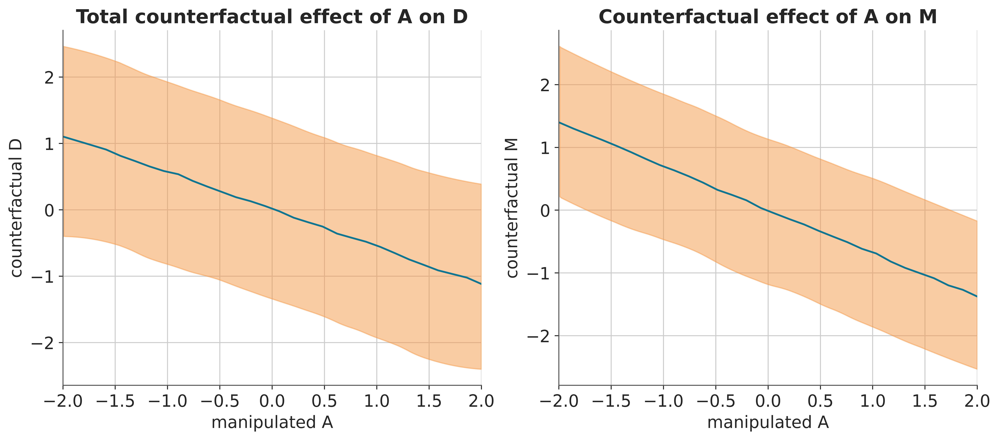

In [51]:
# counterfactual plot A (-> M) -> D
_, ax = plt.subplots(1, 2)
ax[0].plot(A_seq, post_pred.D.mean(dim=("chain", "draw")))
az.plot_hdi(A_seq, post_pred.D, ax=ax[0], color="C2")
ax[0].set(xlim=[-2, 2], xlabel="manipulated A", ylabel="counterfactual D", title="Total counterfactual effect of A on D")

# counterfactual plot A -> M 
ax[1].plot(A_seq, post_pred.M.mean(dim=("chain", "draw")))
az.plot_hdi(A_seq, post_pred.M, ax=ax[1], color="C2")
ax[1].set(xlim=[-2, 2], xlabel="manipulated A", ylabel="counterfactual M", title="Counterfactual effect of A on M");

# conclusion: the direct effect of M on D is low

In [58]:
# see the posteriors also for proof
az.plot_posterior(trace5_3A, var_names=["bM", "bAM", "bA"]);

### Code 5.23

In [107]:
with m5_3A:
    M_seq = np.linspace(-2, 2, 50)
    M_shared.set_value(M_seq)
    A_shared.set_value(np.zeros(50))
    post_pred = pm.sample_posterior_predictive(trace5_3A).posterior_predictive

Sampling: [D, M]


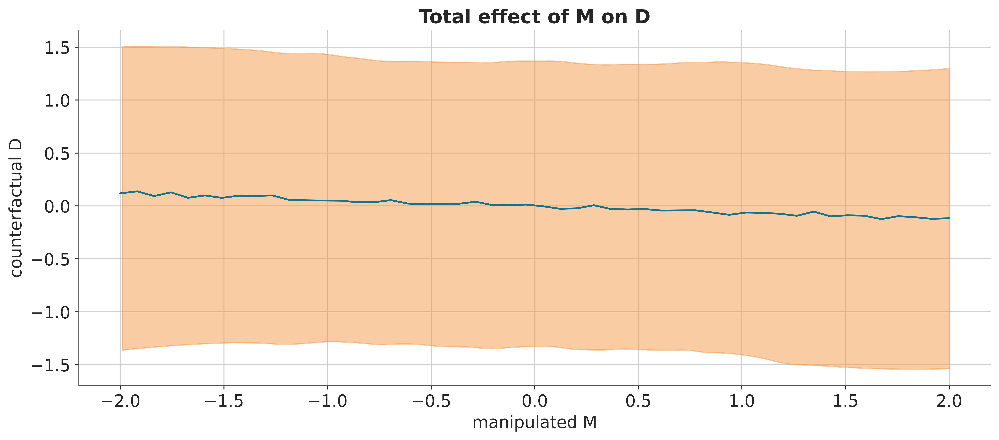

In [109]:
_, ax = plt.subplots()
ax.plot(M_seq, post_pred.D.mean(("chain", "draw")))
az.plot_hdi(M_seq, post_pred.D, color="C2")
ax.set(xlabel="manipulated M", ylabel="counterfactual D", title="Total effect of M on D");

In [111]:
with m5_3A:
    M_seq = np.linspace(-2, 2, 50)
    M_shared.set_value(M_seq)
    A_shared.set_value(np.zeros(50))
    ipred = pm.sample_posterior_predictive(trace5_3A, var_names=["D"])

Sampling: [D]


### Code 5.27

In [46]:
d = pd.read_csv("./Data/milk.csv", delimiter=";")
d.head()

,clade,species,kcal.per.g,perc.fat,perc.protein,perc.lactose,mass,neocortex.perc
0,Strepsirrhine,Eulemur fulvus,0.49,16.60,15.42,67.98,1.95,55.16
1,Strepsirrhine,E macaco,0.51,19.27,16.91,63.82,2.09,NaN
2,Strepsirrhine,E mongoz,0.46,14.11,16.85,69.04,2.51,NaN
3,Strepsirrhine,E rubriventer,0.48,14.91,13.18,71.91,1.62,NaN
4,Strepsirrhine,Lemur catta,0.60,27.28,19.50,53.22,2.19,NaN


A popular hypothesis has it that primates with larger brains produce more energetic
milk, so that brains can grow quickly; 

As in previous examples, standardizing
helps us both get a reliable approximation of the posterior as well as build reasonable priors.

In [47]:
from sklearn.preprocessing import StandardScaler
d.mass = np.log(d.mass)
d[["K", "N", "M"]] = StandardScaler().fit_transform(d[["kcal.per.g", "neocortex.perc", "mass"]])
d.head()

,clade,species,kcal.per.g,perc.fat,perc.protein,perc.lactose,mass,neocortex.perc,K,N,M
0,Strepsirrhine,Eulemur fulvus,0.49,16.60,15.42,67.98,0.667829,55.16,-0.956680,-2.144217,-0.463904
1,Strepsirrhine,E macaco,0.51,19.27,16.91,63.82,0.737164,NaN,-0.830572,NaN,-0.422348
2,Strepsirrhine,E mongoz,0.46,14.11,16.85,69.04,0.920283,NaN,-1.145842,NaN,-0.312595
3,Strepsirrhine,E rubriventer,0.48,14.91,13.18,71.91,0.482426,NaN,-1.019734,NaN,-0.575027
4,Strepsirrhine,Lemur catta,0.60,27.28,19.50,53.22,0.783902,NaN,-0.263087,NaN,-0.394336


In [131]:
with pm.Model() as m5_5_draft:
    # vague priors 
    a = pm.Normal("a", 0, 1)
    bN = pm.Normal("bN", 0, 1)
    sigma = pm.Exponential("sigma", 1)
    mu = a + bN*d.N.values
    K = pm.Normal("K", mu, sigma, observed=d.K)
    pm.find_MAP()
    idata = pm.sample()

SamplingError: Initial evaluation of model at starting point failed!
Starting values:
{'a': array(0.), 'bN': array(0.), 'sigma_log__': array(0.)}

Initial evaluation results:
{'a': -0.92, 'bN': -0.92, 'sigma': -1.0, 'K': nan}

Interestingly, the variable that has missing values is N, but the error message indicates K has NaN values, hmm.

### Code 5.31

In [49]:
dcc = d.dropna(how="any", axis=0).copy()
#dcc.mass = np.log(dcc.mass)
dcc.shape
# cc == complete case (analysis)

(17, 11)

### Code 5.32

In [150]:
with pm.Model() as m5_5_draft:
    # vague priors 
    a = pm.Normal("a", 0, 1)
    bN = pm.Normal("bN", 0, 1)
    sigma = pm.Exponential("sigma", 1)
    N_shared = shared(dcc.N.values)
    mu = pm.Deterministic("mu", a + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=dcc.K.values, shape=mu.shape)
    pm.find_MAP()
    idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


 As in many simple
linear regression problems, these priors are harmless. But are they reasonable? It is important to build reasonable priors, because as the model becomes less simple, the priors can
be very helpful, but only if they are scientifically reasonable.

### Code 5.33

Sampling: [K, a, bN, sigma]


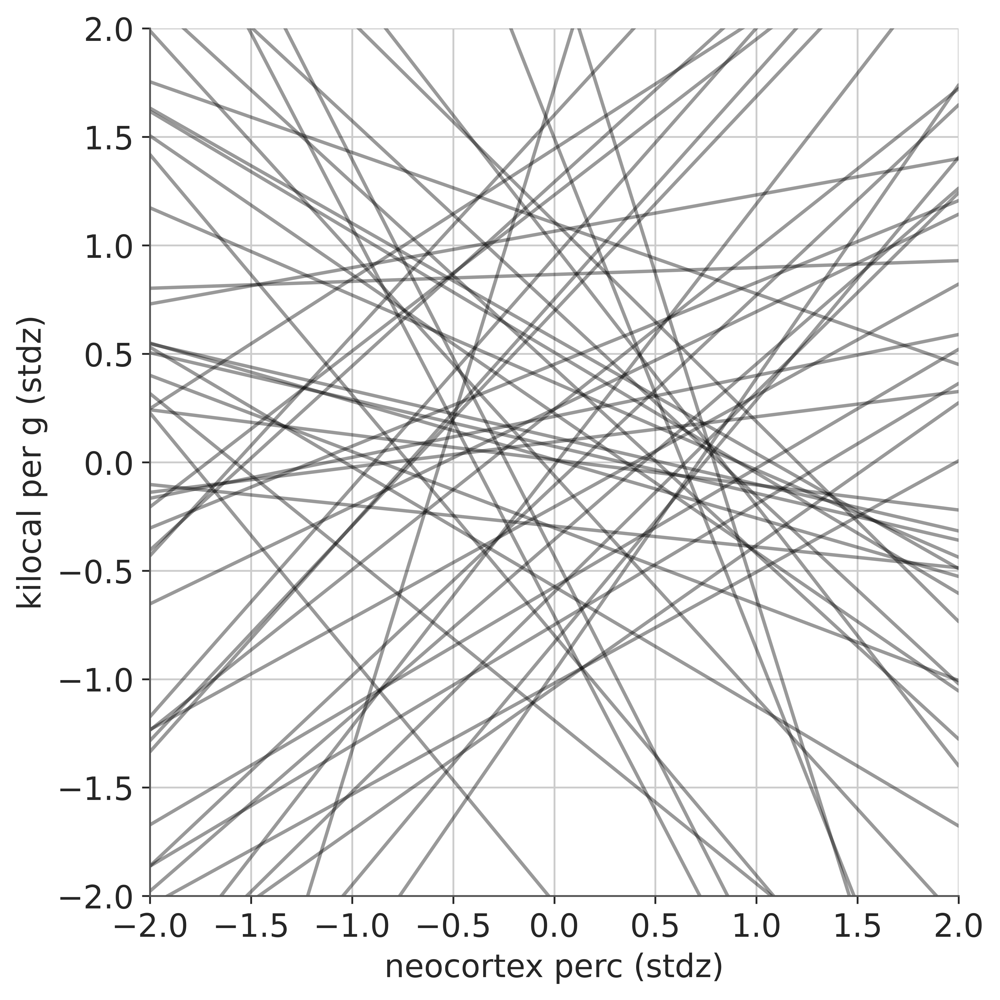

In [163]:
with m5_5_draft:
    N_seq = [-2, 2]
    N_shared.set_value(N_seq)
    priors = pm.sample_prior_predictive().prior
    
_, ax = plt.subplots(figsize=(6, 6))
for i in range(50):
    ax.plot(N_seq, priors.mu[0, i, :], color="k", alpha=0.4)
ax.set(xlabel="neocortex perc (stdz)", ylabel="kilocal per g (stdz)", ylim=N_seq, xlim=N_seq);

How to do better: tightening $\alpha$ so that it's closer to 0 (since the two variables are stdz). Tighter slope prior for more regularization.

### Code 5.34

In [61]:
with pm.Model() as m5_5:
    a = pm.Normal("a", 0, 0.2)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    N_shared = shared(dcc["N"].values)
    mu = pm.Deterministic("mu", a + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=dcc["K"].values, shape=mu.shape)
    trace5_5 = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


Sampling: [K, a, bN, sigma]


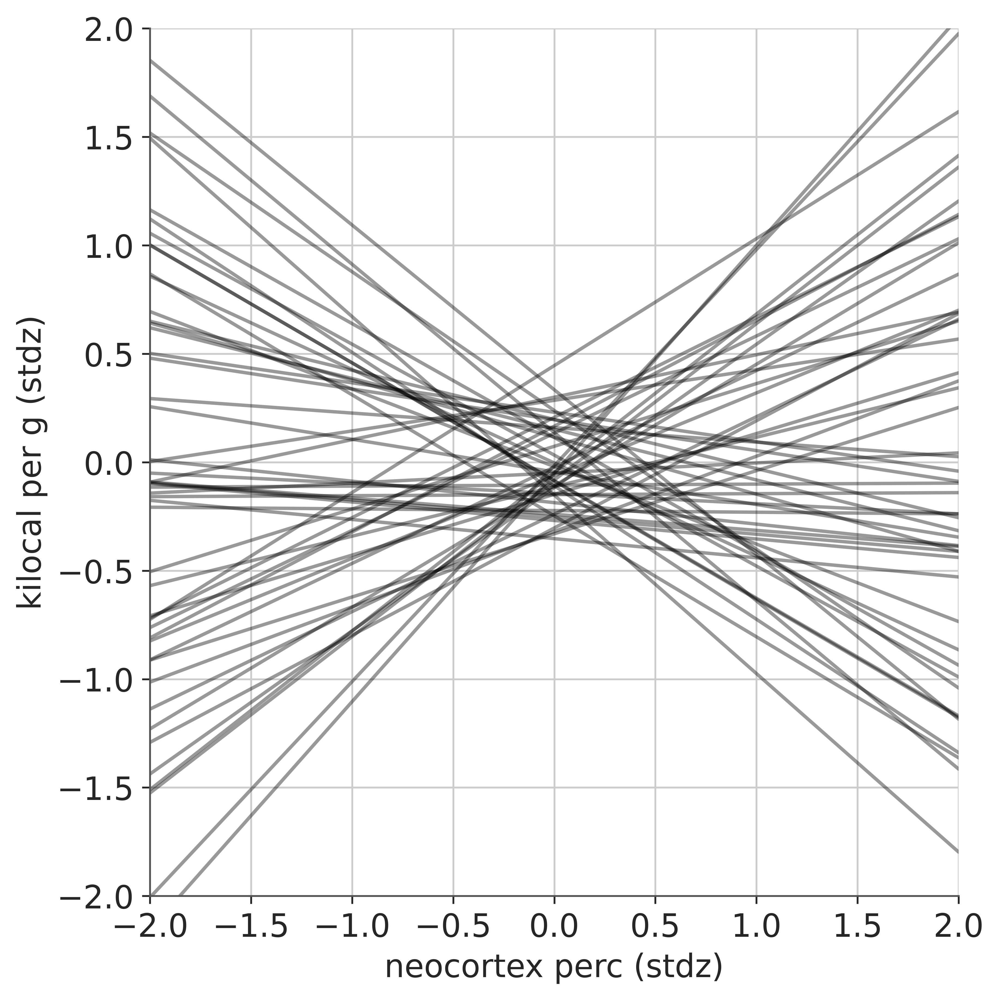

In [16]:
with m5_5:
    N_seq = [-2, 2]
    N_shared.set_value(N_seq)
    priors = pm.sample_prior_predictive().prior
    
_, ax = plt.subplots(figsize=(6, 6))
for i in range(50):
    ax.plot(N_seq, priors.mu[0, i, :], color="k", alpha=0.4)
ax.set(xlabel="neocortex perc (stdz)", ylabel="kilocal per g (stdz)", ylim=N_seq, xlim=N_seq);

Now let's look at the posterior
### Code 5.35

In [18]:
az.summary(trace5_5, var_names=["a", "bN", "sigma"], kind="stats", round_to=2)

,mean,sd,hdi_5.5%,hdi_94.5%
a,0.05,0.19,-0.25,0.35
bN,0.01,0.00,0.00,0.01
sigma,0.19,0.04,0.13,0.24


You might not get why `m5_5` is not a good fit just from the above table. Let's plot the mean reponse v. observed data below.

### Code 5.36

Sampling: []


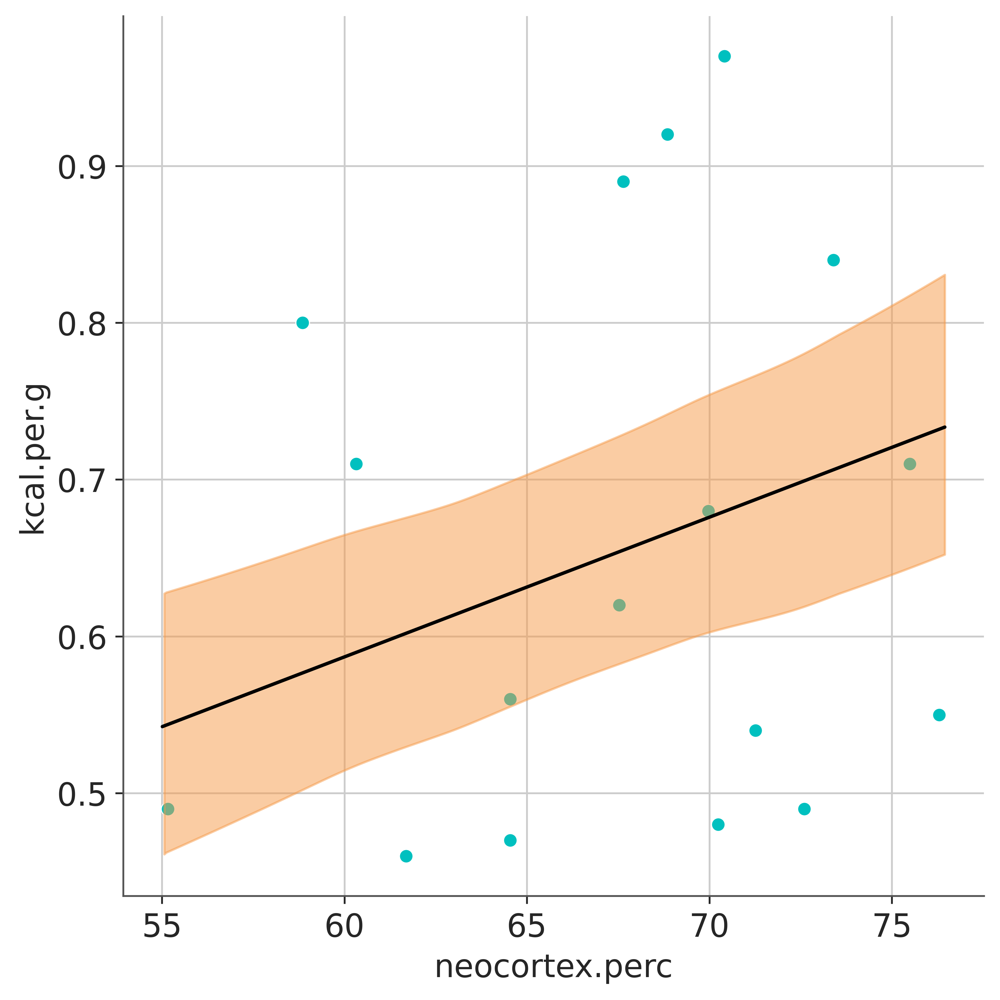

In [21]:
with m5_5:
    N_seq = np.linspace(dcc["neocortex.perc"].min() - 0.15, dcc["neocortex.perc"].max() + 0.15, len(dcc))
    N_shared.set_value(N_seq)
    pred = pm.sample_posterior_predictive(trace5_5, var_names=["mu"]).posterior_predictive
    
_, ax = plt.subplots(figsize=(6, 6))
ax.plot(N_seq, pred.mu.mean(("chain", "draw")), color="k")
sns.scatterplot(data=dcc, x="neocortex.perc", y="kcal.per.g", color="C1", ax=ax)
az.plot_hdi(N_seq, pred.mu, ax=ax, color="C2");

### Code 5.37

In [50]:
with pm.Model() as m5_6:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(dcc["M"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared)
    K = pm.Normal("K", mu, sigma, observed=dcc["K"].values, shape=mu.shape)
    trace5_6 = pm.sample()
az.summary(trace5_6, kind="stats", var_names=["a", "bM", "sigma"])

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
a,0.039,0.160,-0.211,0.296
bM,-0.277,0.209,-0.602,0.042
sigma,1.078,0.201,0.766,1.364


Sampling: []


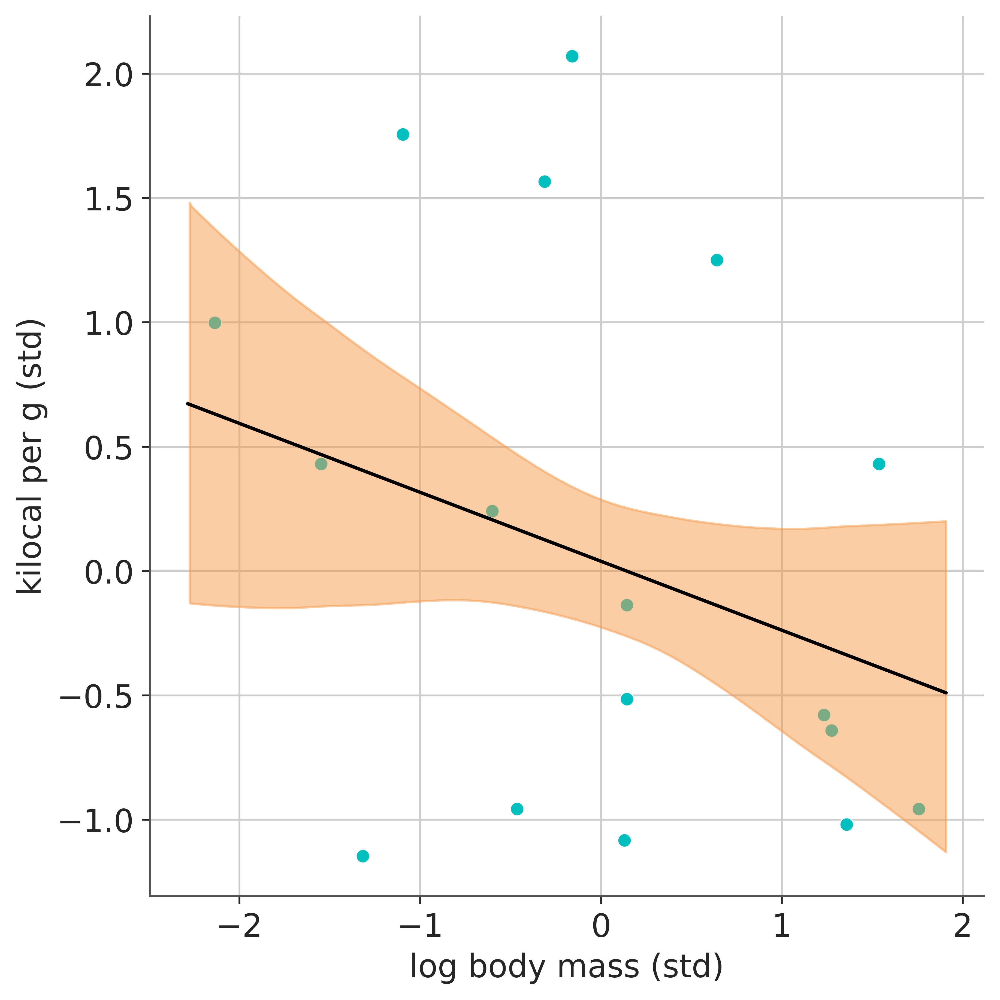

In [52]:
with m5_6:
    M_seq = np.linspace(dcc["M"].min() - 0.15, dcc["M"].max() + 0.15, len(dcc))
    M_shared.set_value(M_seq)
    pred = pm.sample_posterior_predictive(trace5_6, var_names=["mu"]).posterior_predictive
    
_, ax = plt.subplots(figsize=(6, 6))
ax.plot(M_seq, pred.mu.mean(("chain", "draw")), color="k")
sns.scatterplot(data=dcc, x="M", y="K", color="C1", ax=ax)
az.plot_hdi(M_seq, pred.mu, ax=ax, color="C2");
ax.set(xlabel="log body mass (std)", ylabel="kilocal per g (std)");

### Code 5.38

In [81]:
with pm.Model() as m5_7:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(dcc["M"].values)
    N_shared = shared(dcc["N"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=dcc["K"])
    trace5_7 = pm.sample()
az.summary(trace5_7, kind="stats", var_names=["a", "bM", "bN", "sigma"], round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
a,0.06,0.14,-0.16,0.31
bM,-0.65,0.24,-1.03,-0.26
bN,0.61,0.27,0.19,1.03
sigma,0.88,0.18,0.58,1.12


### Code 5.39

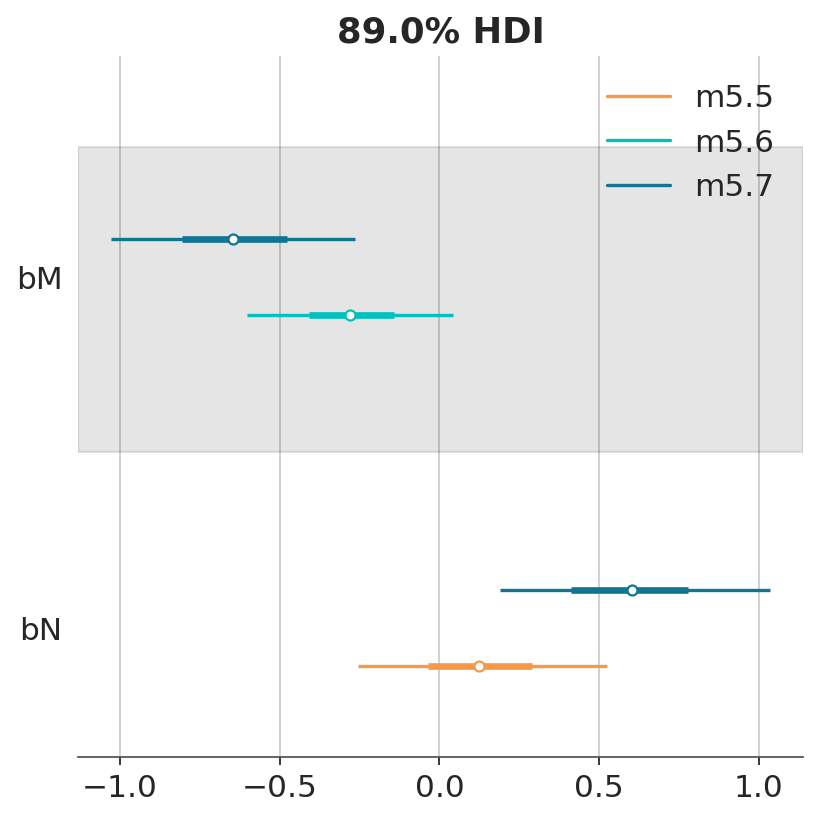

In [78]:
_, ax = plt.subplots(figsize=(5, 5), dpi=80)
az.plot_forest(
    [trace5_7, trace5_6, trace5_5],
    model_names=["m5.7", "m5.6", "m5.5"],
    var_names=["bM", "bN"],
    combined=True,
    ax = ax
);

### Code 5.40

Sampling: []


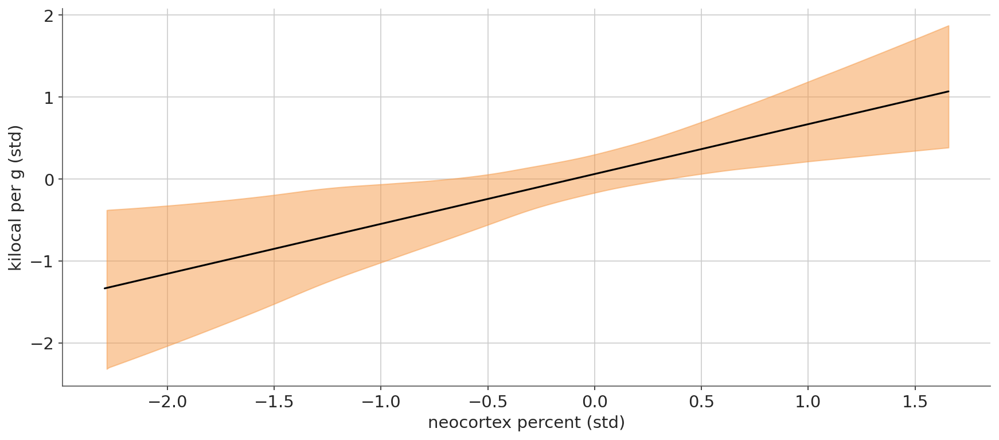

In [94]:
N_seq = np.linspace(dcc.N.min() - 0.15, dcc.N.max() + 0.15, 30)
with m5_7:
    N_shared.set_value(N_seq)
    M_shared.set_value(np.zeros(30))
    mu_ppd = pm.sample_posterior_predictive(trace5_7, var_names=["mu"]).posterior_predictive.mu
mu_mean = mu_ppd.mean(("chain", "draw"))

_, ax = plt.subplots(dpi=75)
ax.plot(N_seq, mu_mean, color="k")
az.plot_hdi(N_seq, mu_ppd, ax=ax, color="C2")
ax.set(xlabel="neocortex percent (std)", ylabel="kilocal per g (std)");

Sampling: []


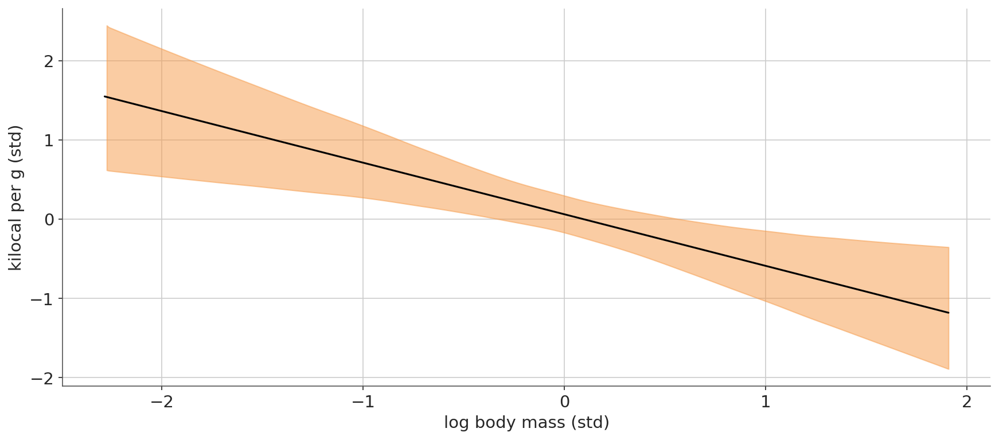

In [95]:
M_seq = np.linspace(dcc.M.min() - 0.15, dcc.M.max() + 0.15, 30)
with m5_7:
    M_shared.set_value(M_seq)
    N_shared.set_value(np.zeros(30))
    mu_ppd = pm.sample_posterior_predictive(trace5_7, var_names=["mu"]).posterior_predictive.mu
mu_mean = mu_ppd.mean(("chain", "draw"))

_, ax = plt.subplots(dpi=75)
ax.plot(M_seq, mu_mean, color="k")
az.plot_hdi(M_seq, mu_ppd, ax=ax, color="C2")
ax.set(xlabel="log body mass (std)", ylabel="kilocal per g (std)");

### Code 5.41

In [111]:
# M -> K <- N
# M -> N
n = 100
M = rng.normal(size=100)
N = rng.normal(size=100, loc=M)
K = rng.normal(size=100, loc=N-M)
d_sim = pd.DataFrame({"K": K, "N": N, "M": M})

In [114]:
with pm.Model() as m5_5:
    a = pm.Normal("a", 0, 0.2)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    N_shared = shared(d_sim["N"].values)
    mu = pm.Deterministic("mu", a + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim["K"].values)
    trace5_5 = pm.sample()
az.summary(trace5_5, var_names=["bN"], kind="stats")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
bN,0.503,0.091,0.343,0.637


In [115]:
with pm.Model() as m5_6:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(d_sim["M"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim["K"].values)
    trace5_6 = pm.sample()
az.summary(trace5_6, kind="stats", var_names=["bM"])

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
bM,-0.02,0.141,-0.226,0.222


In [118]:
with pm.Model() as m5_7:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(d_sim["M"].values)
    N_shared = shared(d_sim["N"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim["K"])
    trace5_7 = pm.sample()
az.summary(trace5_7, kind="stats", var_names=["bM", "bN"], round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
bM,-0.90,0.14,-1.11,-0.68
bN,0.95,0.10,0.79,1.10


### Code 5.42

In [120]:
# M -> K <- N
# N -> M
n = 100
N = rng.normal(size=n)
M = rng.normal(size=n, loc=N)
K = rng.normal(size=n, loc=N-M)
d_sim2 = pd.DataFrame({"K": K, "N": N, "M": M})

In [121]:
with pm.Model() as m5_5:
    a = pm.Normal("a", 0, 0.2)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    N_shared = shared(d_sim2["N"].values)
    mu = pm.Deterministic("mu", a + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim2["K"].values)
    trace5_5 = pm.sample()
az.summary(trace5_5, var_names=["bN"], kind="stats")

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
bN,0.212,0.154,-0.021,0.472


In [122]:
with pm.Model() as m5_6:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(d_sim2["M"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim2["K"].values)
    trace5_6 = pm.sample()
az.summary(trace5_6, kind="stats", var_names=["bM"])

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
bM,-0.549,0.094,-0.686,-0.382


In [123]:
with pm.Model() as m5_7:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(d_sim2["M"].values)
    N_shared = shared(d_sim2["N"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim2["K"])
    trace5_7 = pm.sample()
az.summary(trace5_7, kind="stats", var_names=["bM", "bN"], round_to=2)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


,mean,sd,hdi_5.5%,hdi_94.5%
bM,-1.00,0.09,-1.15,-0.86
bN,1.09,0.14,0.89,1.32


In [125]:
# M -> K <- N
# M <- U -> N
n = 100
U = rng.normal(n)
N = rng.normal(size=n, loc=U)
M = rng.normal(size=n, loc=U)
K = rng.normal(size=n, loc=N-M)
d_sim3 = pd.DataFrame({"K": K, "N": N, "M": M})

In [127]:
with pm.Model() as m5_5:
    a = pm.Normal("a", 0, 0.2)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    N_shared = shared(d_sim2["N"].values)
    mu = pm.Deterministic("mu", a + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim2["K"].values)
    trace5_5 = pm.sample()
print(az.summary(trace5_5, var_names=["bN"], kind="stats"))

with pm.Model() as m5_6:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(d_sim2["M"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim2["K"].values)
    trace5_6 = pm.sample()
print(az.summary(trace5_6, kind="stats", var_names=["bM"]))

with pm.Model() as m5_7:
    a = pm.Normal("a", 0, 0.2)
    bM = pm.Normal("bM", 0, 0.5)
    bN = pm.Normal("bN", 0, 0.5)
    sigma = pm.Exponential("sigma", 1)
    M_shared = shared(d_sim2["M"].values)
    N_shared = shared(d_sim2["N"].values)
    mu = pm.Deterministic("mu", a + bM*M_shared + bN*N_shared)
    K = pm.Normal("K", mu, sigma, observed=d_sim2["K"])
    trace5_7 = pm.sample()
print(az.summary(trace5_7, kind="stats", var_names=["bM", "bN"], round_to=2))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 5 seconds.


     mean     sd  hdi_5.5%  hdi_94.5%
bN  0.001  0.003    -0.004      0.005


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 5 seconds.


     mean     sd  hdi_5.5%  hdi_94.5%
bM  0.001  0.003    -0.004      0.005


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a, bM, bN, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 93 seconds.


    mean    sd  hdi_5.5%  hdi_94.5%
bM -0.91  0.09     -1.04      -0.77
bN  0.91  0.09      0.77       1.04


### Code 5.43

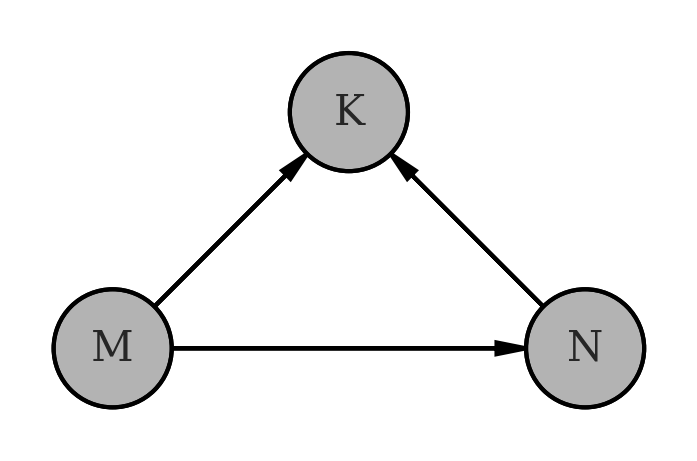

In [18]:
plt.rcParams["font.family"] = "DejaVu Serif"
dag5_7 = PGM(aspect=1, dpi=150)
dag5_7.add_node("M", "M", 0, 0, observed=True)
dag5_7.add_node("K", "K", 1, 1, observed=True)
dag5_7.add_node("N", "N", 2, 0, observed=True)
dag5_7.add_edge("M", "N")
dag5_7.add_edge("M", "K")
dag5_7.add_edge("N", "K")
dag5_7.render();